In [12]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
import IPython.display as ipd 

In [101]:
def processing_audio(sample_audio, sr, bpm):
    onset_env = librosa.onset.onset_strength(sample_audio, sr=sr, aggregate=np.median)
    tempo, beats = librosa.beat.beat_track(sample_audio, sr=sr, start_bpm=40)
    return onset_env, tempo, beats

In [113]:
def display(onset_env, sr, beats):
    hop_length = 4096
    times = librosa.frames_to_time(np.arange(len(onset_env)), sr=sr, hop_length=hop_length)
    plt.figure(figsize=(20, 6))
    plt.plot(times, librosa.util.normalize(onset_env), label='Onset strength')
    plt.vlines(times[beats], 0, 1, alpha=0.5, color='r', linestyle='--', label='Beats')
    plt.legend(frameon=True, framealpha=0.75)
    plt.xlim(500,750) #just a window from an audio
    plt.tight_layout()
    plt.show()

The choice for audio in brackets.

In [15]:
sample_audio, sr = librosa.load('./Bon Jovi - Livin\' On A Prayer.wav') #sr - sampling rate, y - audiofile

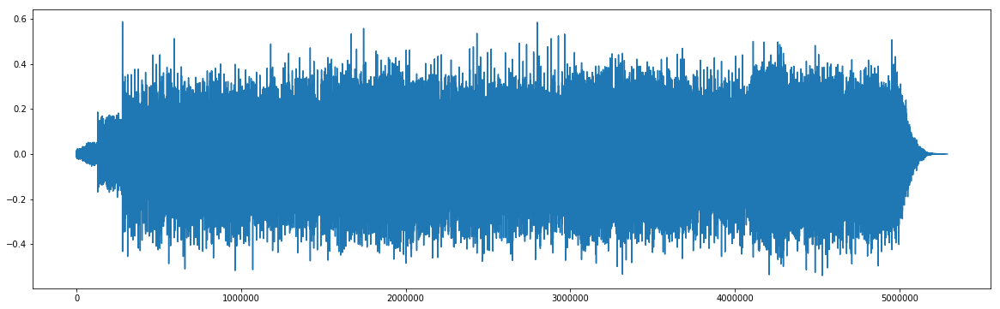

In [115]:
plt.figure(figsize=(20,6))
plt.plot(sample_audio, label='raw audio');

The choice of "start_bpm" - last argument (20,40,60,80).

In [102]:
onset_env, tempo, beats = processing_audio(sample_audio, sr, 40)

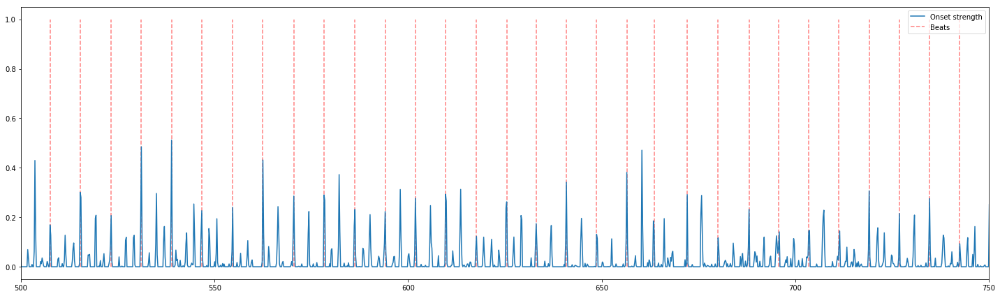

In [114]:
display(onset_env, sr, beats)

In [116]:
beats = librosa.frames_to_time(beats, sr=sr)
clicks = librosa.clicks(beats, sr=sr, length=len(sample_audio))
ipd.Audio(sample_audio+clicks, rate=sr)

In [ ]:
librosa.output.write_wav('BJ_40bpm.wav', sample_audio+clicks, sr)